# Interpretability of pain behavior recognition

## First we need dataframes for every subject

In [21]:
import sys
sys.path.append('../')

%matplotlib inline

# DEFINE GRAPH
import pandas as pd
import numpy as np
import utils

from importlib import reload
reload(utils)

pd.set_option('max_colwidth', 800) 

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
# Data paths
rgb_path = '../data/jpg_128_128_2fps/'
of_path = '../data/jpg_128_128_16fps_OF_magnitude_cv2/'

# Hyperparameters
input_width = 128
input_height = 128
seq_length = 10
seq_stride = 10
batch_size = 1
COLOR = True
nb_labels = 2

# Data augmentation
aug_flip = 0
aug_crop = 0
aug_light = 0

subject_ids = pd.read_csv('../metadata/horse_subjects.csv')['Subject'].values
channels = 3

In [4]:
from utils import ArgsProxy
args = ArgsProxy(rgb_path, of_path, input_height, input_width,
                 seq_length, seq_stride, batch_size, nb_labels,
                 aug_flip, aug_crop, aug_light)

In [5]:
import data_handler as dathand
dh = dathand.DataHandler(path=args.data_path,
                 of_path=args.of_path,
                 clip_list_file='videos_overview_missingremoved.csv',
                 data_columns=['Pain'],  # Here one can append f. ex. 'Observer'
                 image_size=(args.input_height, args.input_width),
                 seq_length=args.seq_length,
                 seq_stride=args.seq_stride,
                 batch_size=args.batch_size,
                 color=COLOR,
                 nb_labels=args.nb_labels,
                 aug_flip=args.aug_flip,
                 aug_crop=args.aug_crop,
                 aug_light=args.aug_light)

In [6]:
import utils
subject_dfs = utils.read_or_create_subject_dfs(dh, args, subject_ids)

../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/
../data/jpg_128_128_2fps/


In [7]:
subject_dfs = utils.read_or_create_subject_rgb_and_OF_dfs(dh, args, subject_ids, subject_dfs)

In [8]:
sequence_df = utils.get_sequence(args=args, subject_dfs=subject_dfs, subject=4)
y = sequence_df['Pain'].values
image_paths = sequence_df['Path'].values
of_paths = sequence_df['OF_Path'].values

Chose subject  4
Start index in subject dataframe:  9092


In [9]:
from keras.utils import np_utils
label_onehot = np_utils.to_categorical(y, num_classes=args.nb_labels)
label_onehot
batch_label = label_onehot.reshape(args.batch_size, args.seq_length, -1)

batch_img = np.concatenate(utils.read_images_and_return_list(args, image_paths, 'local'), axis=1)
batch_flow = np.concatenate(utils.read_images_and_return_list(args, of_paths, 'local'), axis=1)

## Now that we have frames from all subjects, we can import gradcam functionality

In [10]:
# Choose a model to work on
two_stream = True

if two_stream: # This model got 88.09 % F1-score
    best_model_path = '../models/BEST_MODEL_2stream_5d_adadelta_LSTMunits_32_CONVfilters_16_add_v4_t0_4hl_128jpg2fps_seq10_bs8_adadelta_noaug_run1_rerun_for_gradcam.h5'
else:
    best_model_path = '../models/1stream_summer_2018/no_aug/BEST_MODEL_convolutional_LSTM_adadelta_LSTMunits_32_CONVfilters_None_jpg128_2fps_val0_t4_seq10ss10_4hl_32ubs16_no_aug_run4.h5'
import keras
m = keras.models.load_model(best_model_path)

In [11]:
from keras import backend as K
import tensorflow as tf
    
images = tf.placeholder(tf.float32, [batch_size, args.seq_length, args.input_width, args.input_height, channels])
flows = tf.placeholder(tf.float32, [batch_size, args.seq_length, args.input_width, args.input_height, channels])
labels = tf.placeholder(tf.float32, [batch_size, args.seq_length, 2])

if two_stream:
    clstm_model = utils.TwoStreamCLSTMNetwork(images, flows, from_scratch=0, path=best_model_path)
else:
    clstm_model = utils.CLSTMNetwork(images, from_scratch=0, path=best_model_path)

sess = K.get_session()  # Grab the Keras session where the weights are initialized.

cost = (-1) * tf.reduce_sum(tf.multiply(labels, tf.log(clstm_model.preds)), axis=1)
    
y_c = tf.reduce_sum(tf.multiply(clstm_model.dense, labels), axis=1)

print('model preds: ', clstm_model.preds)
print('cost: ', cost)
print('y_c: ', y_c)


    
if two_stream:
    # target_conv_layer = clstm_model.clstm1_rgb # Choose which CLSTM-layer to study
    target_conv_layer = clstm_model.merge # Choose which CLSTM-layer to study
else:
    target_conv_layer = clstm_model.clstm4 # Choose which CLSTM-layer to study
    
print('tcl: ', target_conv_layer)
print('TYPE tcl: ', type(target_conv_layer))
    
target_conv_layer_grad = tf.gradients(y_c, target_conv_layer)[0]

print('tclg: ', target_conv_layer_grad)
    
gb_grad = tf.gradients(cost, [images, flows])[0]  # Guided backpropagation back to input layer

model preds:  Tensor("activation_1_2/Sigmoid:0", shape=(1, 10, 2), dtype=float32)
cost:  Tensor("mul_1:0", shape=(1, 2), dtype=float32)
y_c:  Tensor("Sum_1:0", shape=(1, 2), dtype=float32)
tcl:  Tensor("multiply_1_2/mul:0", shape=(1, ?, 2048), dtype=float32)
TYPE tcl:  <class 'tensorflow.python.framework.ops.Tensor'>
tclg:  Tensor("gradients/AddN:0", shape=(1, ?, 2048), dtype=float32)


In [12]:
def run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True):
    with sess.as_default():

        # 2-stream
        if two_stream:
            prob = sess.run(clstm_model.preds,
                            feed_dict={images: batch_img,
                                       flows: batch_flow,
                                       K.learning_phase(): 0})

            print(prob)

            gb_grad_value, target_conv_layer_value, target_conv_layer_grad_value =                 sess.run([gb_grad, target_conv_layer, target_conv_layer_grad],
                          feed_dict={images: batch_img,
                                     flows: batch_flow,
                                     labels: batch_label,
                                     K.learning_phase(): 0})

            target_conv_layer_value = np.reshape(target_conv_layer_value,
                                             (1, 10, 8, 8, 32))
            target_conv_layer_grad_value = np.reshape(target_conv_layer_grad_value,
                                             (1, 10, 8, 8, 32))
        else:
            prob = sess.run(clstm_model.preds,
                            feed_dict={images: batch_img,
                                       K.learning_phase(): 0})

            print(prob)
            gb_grad_value, target_conv_layer_value, target_conv_layer_grad_value =                 sess.run([gb_grad, target_conv_layer, target_conv_layer_grad],
                          feed_dict={images: batch_img,
                          labels: batch_label,
                          K.learning_phase(): 0})
            target_conv_layer_value = np.reshape(target_conv_layer_value,
                                         (1, 10, 16, 16, 32))
            target_conv_layer_grad_value = np.reshape(target_conv_layer_grad_value,
                                         (1, 10, 16, 16, 32))


        utils.visualize_overlays(batch_img, target_conv_layer_value,
                           target_conv_layer_grad_value, batch_flow)


# Two-stream predictions for subject 0

Chose subject  0
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_2a/frame_002132.jpg     0
1  data/jpg_128_128_2fps/horse_1/1_2a/frame_002133.jpg     0
2  data/jpg_128_128_2fps/horse_1/1_2a/frame_002134.jpg     0
3  data/jpg_128_128_2fps/horse_1/1_2a/frame_002135.jpg     0
4  data/jpg_128_128_2fps/horse_1/1_2a/frame_002136.jpg     0
5  data/jpg_128_128_2fps/horse_1/1_2a/frame_002137.jpg     0
6  data/jpg_128_128_2fps/horse_1/1_2a/frame_002138.jpg     0
7  data/jpg_128_128_2fps/horse_1/1_2a/frame_002139.jpg     0
8  data/jpg_128_128_2fps/horse_1/1_2a/frame_002140.jpg     0
9  data/jpg_128_128_2fps/horse_1/1_2a/frame_002141.jpg     0
[[[0.6490762  0.35663387]
  [0.7250285  0.30491006]
  [0.5629271  0.17842743]
  [0.4148245  0.10868351]
  [0.3631461  0.09595517]
  [0.32576308 0.09997307]
  [0.24228753 0.08932353]
  [0.16527711 0.10438144]
  [0.11435185 0.1288282 ]
  [0.09212909 0.1396897 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


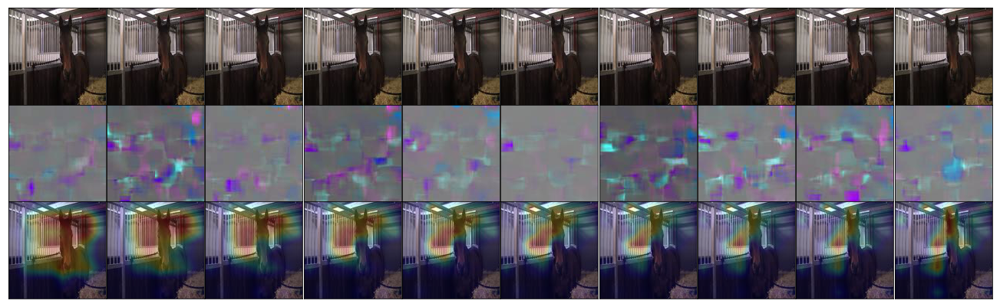

In [90]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_2b/frame_000131.jpg     0
1  data/jpg_128_128_2fps/horse_1/1_2b/frame_000132.jpg     0
2  data/jpg_128_128_2fps/horse_1/1_2b/frame_000133.jpg     0
3  data/jpg_128_128_2fps/horse_1/1_2b/frame_000134.jpg     0
4  data/jpg_128_128_2fps/horse_1/1_2b/frame_000135.jpg     0
5  data/jpg_128_128_2fps/horse_1/1_2b/frame_000136.jpg     0
6  data/jpg_128_128_2fps/horse_1/1_2b/frame_000137.jpg     0
7  data/jpg_128_128_2fps/horse_1/1_2b/frame_000138.jpg     0
8  data/jpg_128_128_2fps/horse_1/1_2b/frame_000139.jpg     0
9  data/jpg_128_128_2fps/horse_1/1_2b/frame_000140.jpg     0
[[[0.6223515  0.37054273]
  [0.8469801  0.17479871]
  [0.88773394 0.09032614]
  [0.93227434 0.06256168]
  [0.9586032  0.08157974]
  [0.97402054 0.12289076]
  [0.9725366  0.13422054]
  [0.9588893  0.17173837]
  [0.94358325 0.2080214 ]
  [0.9251104  0.19750166]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


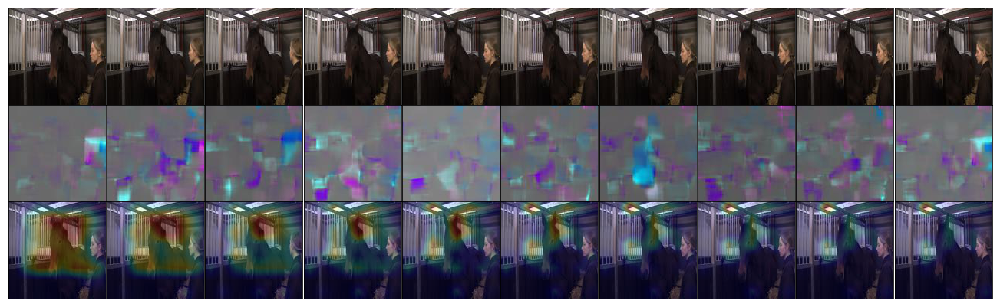

In [91]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                 Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_4/frame_000615.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_4/frame_000616.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_4/frame_000617.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_4/frame_000618.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_4/frame_000619.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_4/frame_000620.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_4/frame_000621.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_4/frame_000622.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_4/frame_000623.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_4/frame_000624.jpg     1
[[[0.49954575 0.4752786 ]
  [0.4380119  0.53553176]
  [0.30560452 0.50636524]
  [0.22713207 0.37829676]
  [0.20615186 0.46069786]
  [0.1293388  0.50597674]
  [0.08057073 0.466571  ]
  [0.03330295 0.3521148 ]
  [0.0134323  0.35534614]
  [0.00820549 0.38723037]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


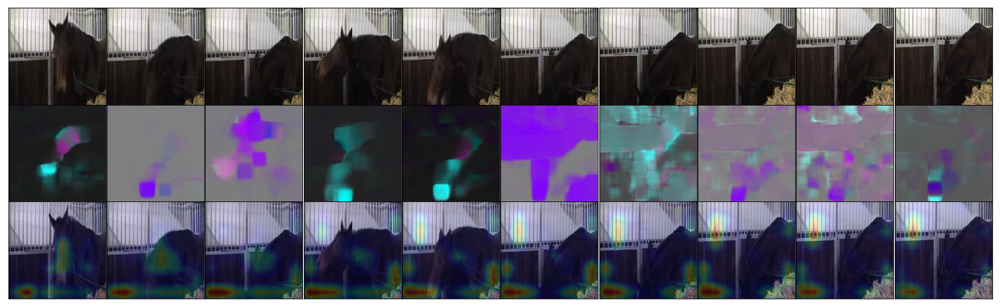

In [92]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                 Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_4/frame_001562.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_4/frame_001563.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_4/frame_001564.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_4/frame_001565.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_4/frame_001566.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_4/frame_001567.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_4/frame_001568.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_4/frame_001569.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_4/frame_001570.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_4/frame_001571.jpg     1
[[[0.61045796 0.29930142]
  [0.6005596  0.20029978]
  [0.6473597  0.11635399]
  [0.70562065 0.111423  ]
  [0.64685476 0.17336883]
  [0.52788293 0.2933066 ]
  [0.3104463  0.49131855]
  [0.17073257 0.5994129 ]
  [0.15506123 0.63173765]
  [0.16972893 0.66396457]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


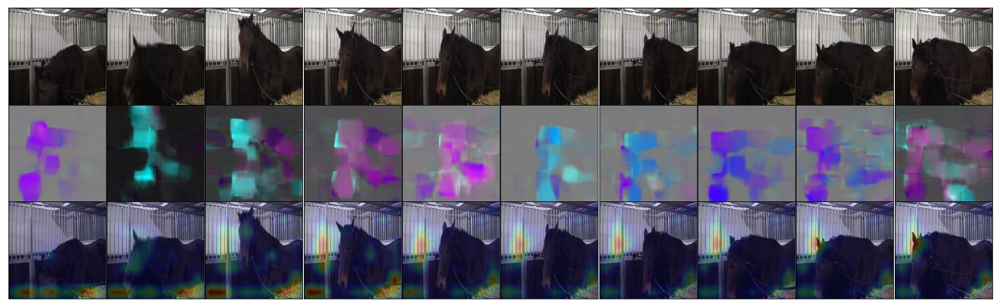

In [93]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002307.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002308.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002309.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002310.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002311.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002312.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002313.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002314.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002315.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002316.jpg     1
[[[0.55393726 0.47291106]
  [0.1987685  0.7354231 ]
  [0.01851653 0.8657447 ]
  [0.003328   0.9430604 ]
  [0.00200175 0.96517855]
  [0.00166182 0.9789994 ]
  [0.00137663 0.98208606]
  [0.00175308 0.9829379 ]
  [0.00430084 0.97993314]
  [0.01012382 0.9758926 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


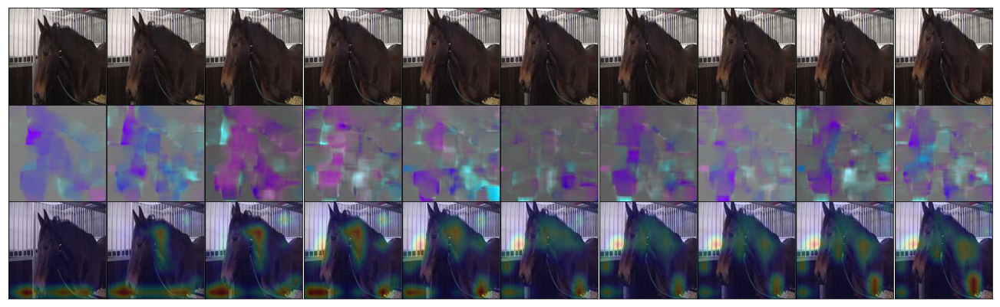

In [94]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000768.jpg     0
1  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000769.jpg     0
2  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000770.jpg     0
3  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000771.jpg     0
4  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000772.jpg     0
5  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000773.jpg     0
6  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000774.jpg     0
7  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000775.jpg     0
8  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000776.jpg     0
9  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_000777.jpg     0
[[[0.70629376 0.2944751 ]
  [0.8987258  0.10929862]
  [0.88165027 0.03106976]
  [0.9117322  0.0198549 ]
  [0.9359404  0.0288268 ]
  [0.9510404  0.03643617]
  [0.9516285  0.0556087 ]
  [0.95947486 0.09608804]
  [0.9518164  0.1671687 ]
  [0.9612501  0.25870848]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


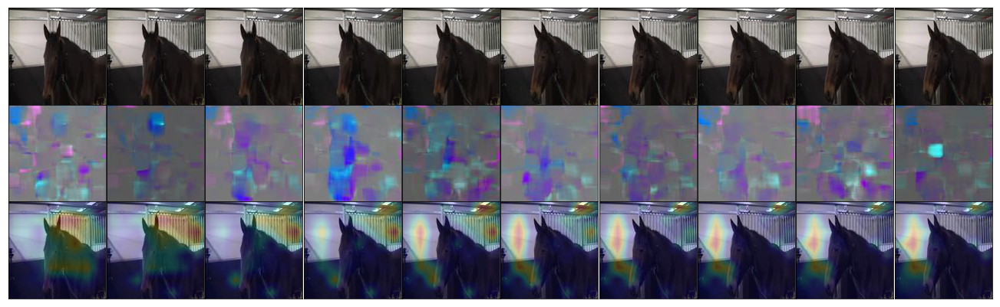

In [95]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                   Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000514.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000515.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000516.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000517.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000518.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000519.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000520.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000521.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000522.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_5_2/frame_000523.jpg     1
[[[0.6707084  0.32279986]
  [0.7878658  0.311648  ]
  [0.7202168  0.37234658]
  [0.6426647  0.37542647]
  [0.6395576  0.26358512]
  [0.63854045 0.14337222]
  [0.6493966  0.09937832]
  [0.6486815  0.1173877 ]
  [0.64644176 0.11810616]
  [0.7237337  0.11579635]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


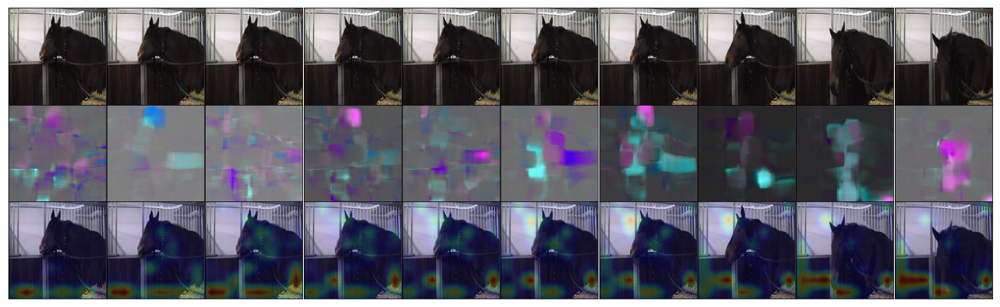

In [96]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000648.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000649.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000650.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000651.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000652.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000653.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000654.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000655.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000656.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000657.jpg     1
[[[0.4921935  0.47836986]
  [0.19049044 0.71650386]
  [0.02551408 0.8420542 ]
  [0.00598807 0.8747386 ]
  [0.00331743 0.901352  ]
  [0.0047261  0.9094596 ]
  [0.00881033 0.918849  ]
  [0.01366656 0.9191561 ]
  [0.01612929 0.9267809 ]
  [0.01615324 0.92849594]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


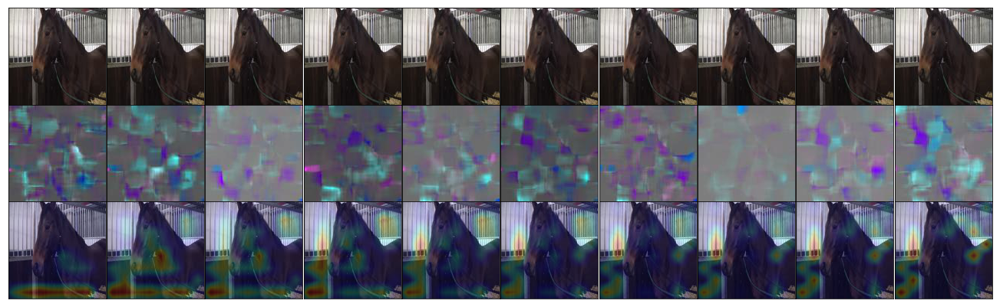

In [97]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_2b/frame_000079.jpg     0
1  data/jpg_128_128_2fps/horse_1/1_2b/frame_000080.jpg     0
2  data/jpg_128_128_2fps/horse_1/1_2b/frame_000081.jpg     0
3  data/jpg_128_128_2fps/horse_1/1_2b/frame_000082.jpg     0
4  data/jpg_128_128_2fps/horse_1/1_2b/frame_000083.jpg     0
5  data/jpg_128_128_2fps/horse_1/1_2b/frame_000084.jpg     0
6  data/jpg_128_128_2fps/horse_1/1_2b/frame_000085.jpg     0
7  data/jpg_128_128_2fps/horse_1/1_2b/frame_000086.jpg     0
8  data/jpg_128_128_2fps/horse_1/1_2b/frame_000087.jpg     0
9  data/jpg_128_128_2fps/horse_1/1_2b/frame_000088.jpg     0
[[[0.6755299  0.31938162]
  [0.93257415 0.08168686]
  [0.97262436 0.00751281]
  [0.97824895 0.00260274]
  [0.9731442  0.00285201]
  [0.96434784 0.00394611]
  [0.9438267  0.00423164]
  [0.9216553  0.00430926]
  [0.89463234 0.00513216]
  [0.8777708  0.00690905]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


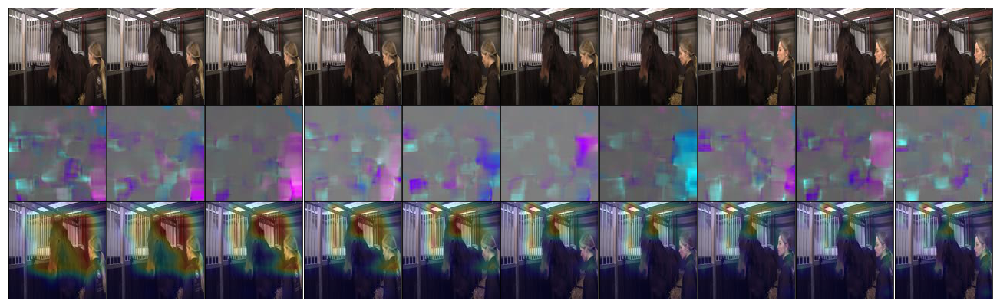

In [73]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001418.jpg     0
1  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001419.jpg     0
2  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001420.jpg     0
3  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001421.jpg     0
4  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001422.jpg     0
5  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001423.jpg     0
6  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001424.jpg     0
7  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001425.jpg     0
8  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001426.jpg     0
9  data/jpg_128_128_2fps/horse_1/1_1a_3/frame_001427.jpg     0
[[[0.6449018  0.32196572]
  [0.7700531  0.21354805]
  [0.71381444 0.16148722]
  [0.7375864  0.14485432]
  [0.770817   0.20421664]
  [0.79342777 0.29024345]
  [0.835909   0.29909697]
  [0.8739425  0.24054483]
  [0.90021676 0.22590923]
  [0.8935162  0.16784668]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


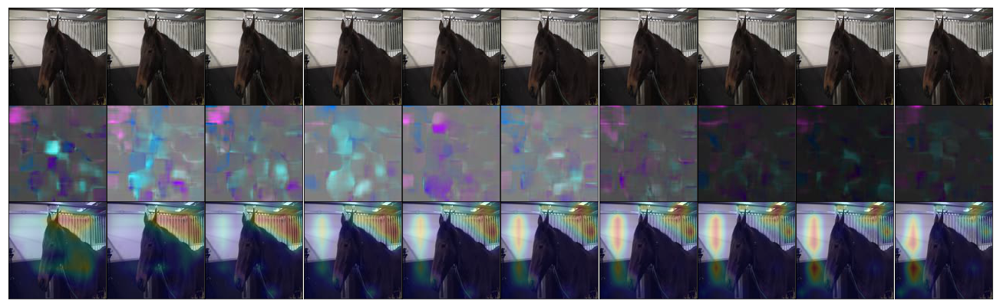

In [74]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000458.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000459.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000460.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000461.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000462.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000463.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000464.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000465.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000466.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3a_2/frame_000467.jpg     1
[[[0.5132925  0.4507603 ]
  [0.24992837 0.6164061 ]
  [0.04044598 0.6467795 ]
  [0.01379501 0.7560416 ]
  [0.01236844 0.89412564]
  [0.01702907 0.94277847]
  [0.01779659 0.94566494]
  [0.02456428 0.9162004 ]
  [0.04372213 0.85371006]
  [0.05212507 0.7793747 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


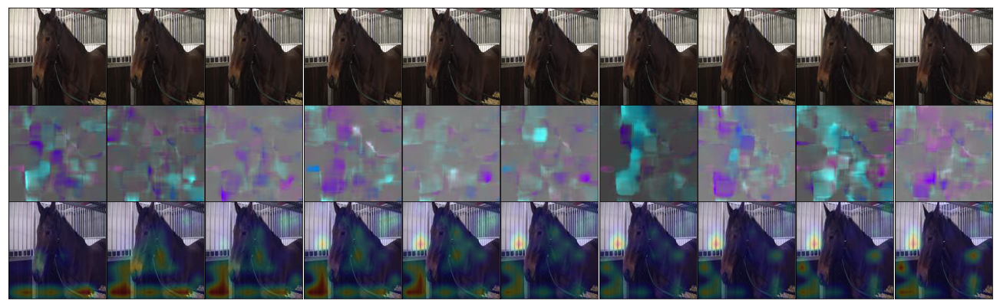

In [98]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3b/frame_000278.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3b/frame_000279.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3b/frame_000280.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3b/frame_000281.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3b/frame_000282.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3b/frame_000283.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3b/frame_000284.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3b/frame_000285.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3b/frame_000286.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3b/frame_000287.jpg     1
[[[0.46993482 0.43687198]
  [0.14046086 0.7358189 ]
  [0.02306889 0.9256437 ]
  [0.00964479 0.9635854 ]
  [0.00563325 0.9654264 ]
  [0.00538511 0.9587408 ]
  [0.00790595 0.9504683 ]
  [0.01255255 0.9489437 ]
  [0.01614446 0.95316124]
  [0.01509165 0.96022105]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


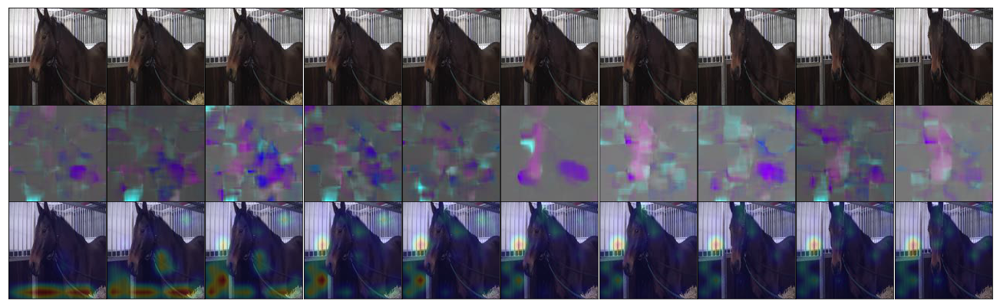

In [99]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002312.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002313.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002314.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002315.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002316.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002317.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002318.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002319.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002320.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_002321.jpg     1
[[[0.501333   0.43583134]
  [0.14213273 0.7084378 ]
  [0.01313858 0.8211303 ]
  [0.0037698  0.8312077 ]
  [0.00279497 0.8790563 ]
  [0.00347559 0.90106755]
  [0.00567178 0.91040593]
  [0.00716532 0.9343918 ]
  [0.00828159 0.9383219 ]
  [0.00761652 0.92677504]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


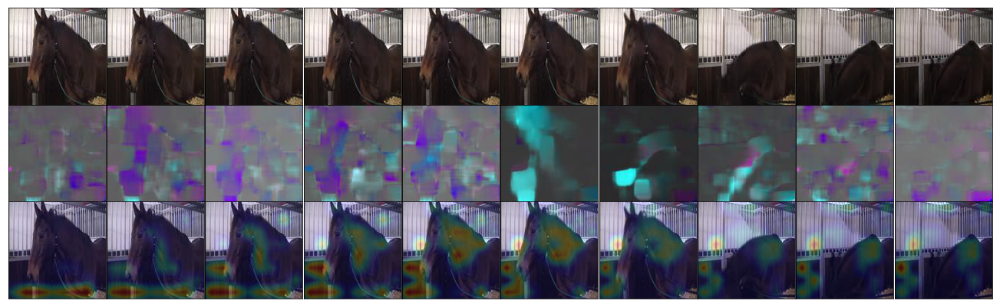

In [100]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000347.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000348.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000349.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000350.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000351.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000352.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000353.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000354.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000355.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000356.jpg     1
[[[0.5361895  0.4489661 ]
  [0.30128244 0.70802605]
  [0.05360658 0.8890789 ]
  [0.01143085 0.9490332 ]
  [0.00459157 0.96770537]
  [0.00290133 0.9755275 ]
  [0.00328279 0.98251146]
  [0.00555344 0.98501956]
  [0.00975815 0.9794967 ]
  [0.01674922 0.96710545]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


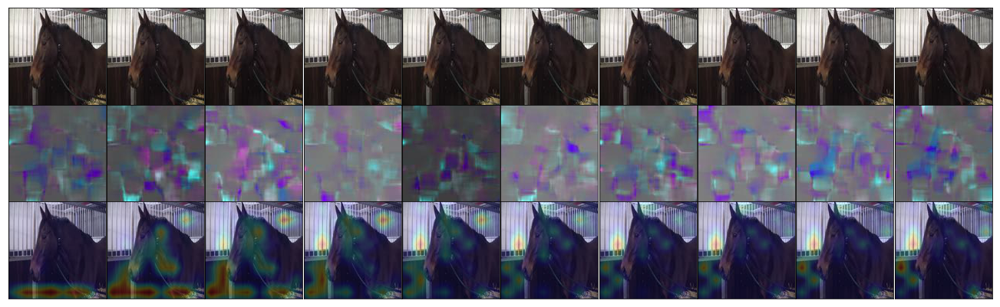

In [101]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
                                                 Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_4/frame_001671.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_4/frame_001672.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_4/frame_001673.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_4/frame_001674.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_4/frame_001675.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_4/frame_001676.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_4/frame_001677.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_4/frame_001678.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_4/frame_001679.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_4/frame_001680.jpg     1
[[[0.59186167 0.3842743 ]
  [0.5323146  0.36141676]
  [0.25979114 0.3659012 ]
  [0.14334795 0.467716  ]
  [0.14577323 0.5398683 ]
  [0.16270445 0.57766104]
  [0.20918198 0.5556924 ]
  [0.23635064 0.4544078 ]
  [0.23067026 0.30587557]
  [0.18839818 0.20604098]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


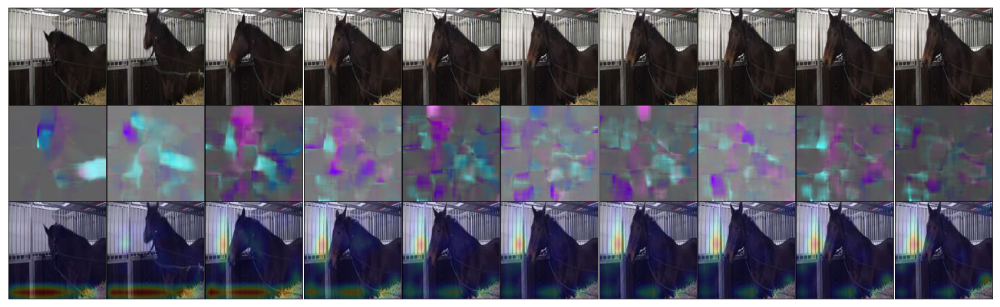

In [104]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  8829
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001576.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001577.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001578.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001579.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001580.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001581.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001582.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001583.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001584.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_001585.jpg     1
[[[5.5010849e-01 4.1829512e-01]
  [2.0776230e-01 7.8294009e-01]
  [1.3924583e-02 9.0326172e-01]
  [2.1465058e-03 9.1873336e-01]
  [1.1255383e-03 9.3587780e-01]
  [5.5309146e-04 9.5509446e-01]
  [3.1653195e-04 9.5514750e-01]
  [3.1514684e-04 9.5540798

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


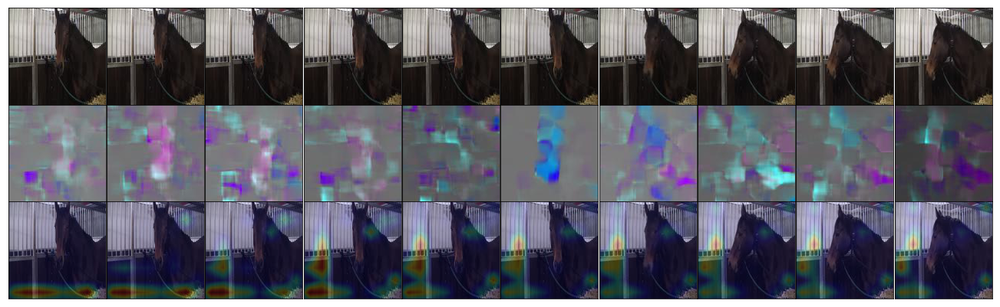

In [13]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  3609
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_1b/frame_000938.jpg     0
1  data/jpg_128_128_2fps/horse_1/1_1b/frame_000939.jpg     0
2  data/jpg_128_128_2fps/horse_1/1_1b/frame_000940.jpg     0
3  data/jpg_128_128_2fps/horse_1/1_1b/frame_000941.jpg     0
4  data/jpg_128_128_2fps/horse_1/1_1b/frame_000942.jpg     0
5  data/jpg_128_128_2fps/horse_1/1_1b/frame_000943.jpg     0
6  data/jpg_128_128_2fps/horse_1/1_1b/frame_000944.jpg     0
7  data/jpg_128_128_2fps/horse_1/1_1b/frame_000945.jpg     0
8  data/jpg_128_128_2fps/horse_1/1_1b/frame_000946.jpg     0
9  data/jpg_128_128_2fps/horse_1/1_1b/frame_000947.jpg     0
[[[0.70760816 0.30638015]
  [0.8846101  0.17293589]
  [0.8185699  0.08119372]
  [0.6954818  0.03513385]
  [0.6386984  0.02546108]
  [0.5448912  0.02890614]
  [0.52615434 0.03472411]
  [0.5896648  0.03373917]
  [0.74116015 0.02739393]
  [0.86308086 0.02637963]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


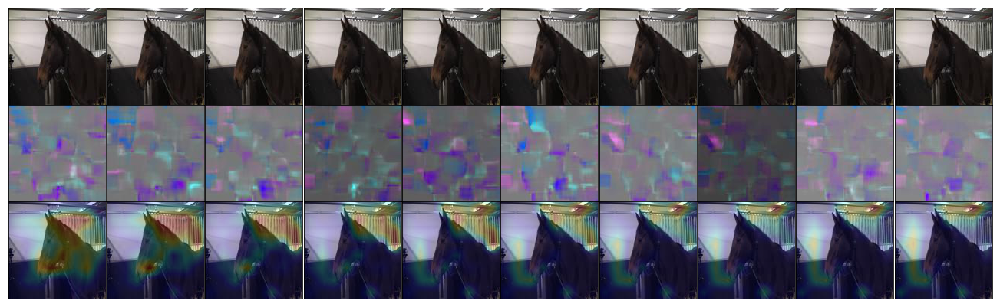

In [14]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  7663
                                                    Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000410.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000411.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000412.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000413.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000414.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000415.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000416.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000417.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000418.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3a_1/frame_000419.jpg     1
[[[5.4118627e-01 4.6304175e-01]
  [1.7037316e-01 8.0114210e-01]
  [6.2732990e-03 9.5184565e-01]
  [5.6460692e-04 9.7888881e-01]
  [1.8923523e-04 9.8637539e-01]
  [1.5234778e-04 9.9003452e-01]
  [1.7268398e-04 9.9327892e-01]
  [2.6473665e-04 9.9519026

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


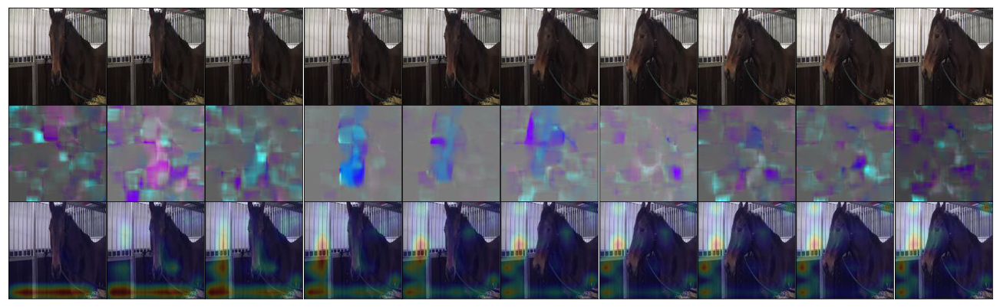

In [15]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  13631
                                                   Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000858.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000859.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000860.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000861.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000862.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000863.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000864.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000865.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000866.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000867.jpg     1
[[[0.57371837 0.38493097]
  [0.39466396 0.5298514 ]
  [0.1849442  0.7598982 ]
  [0.14146481 0.90859306]
  [0.14385493 0.9571594 ]
  [0.1687737  0.98684573]
  [0.26926622 0.99171257]
  [0.36087304 0.98988336]
  [0.43188968 0.98114026]
  [0.53825724 0.9620474 ]]

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


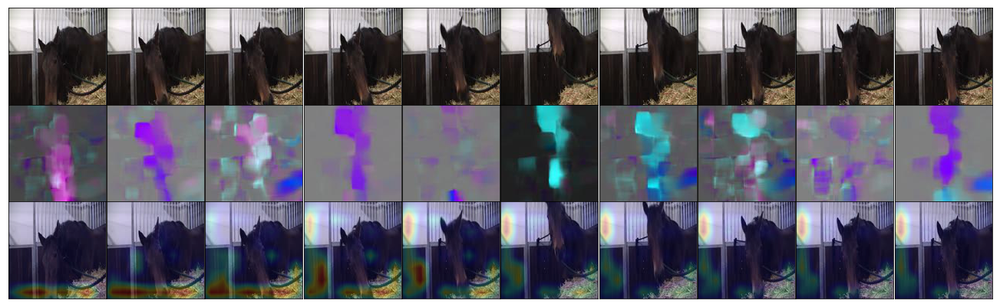

In [16]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  10853
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_3b/frame_000360.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_3b/frame_000361.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_3b/frame_000362.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_3b/frame_000363.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_3b/frame_000364.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_3b/frame_000365.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_3b/frame_000366.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_3b/frame_000367.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_3b/frame_000368.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_3b/frame_000369.jpg     1
[[[0.52429926 0.46383673]
  [0.16310301 0.7463175 ]
  [0.01407471 0.90020555]
  [0.00257895 0.9324722 ]
  [0.0011318  0.95034176]
  [0.00099631 0.96277803]
  [0.00129885 0.9592251 ]
  [0.00191505 0.9408072 ]
  [0.00351868 0.9212827 ]
  [0.0070266  0.9059973 ]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


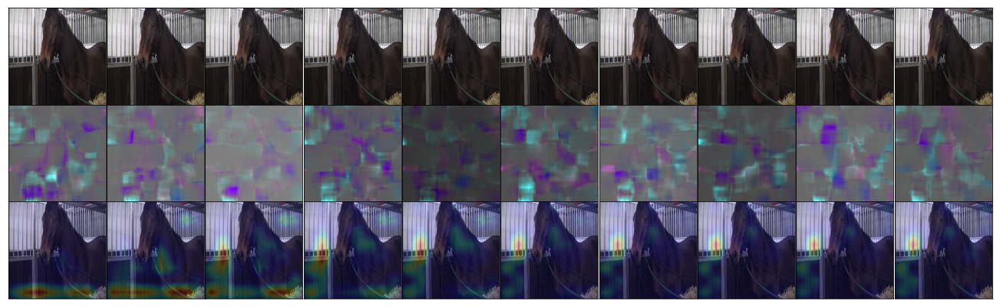

In [17]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  13289
                                                   Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000516.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000517.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000518.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000519.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000520.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000521.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000522.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000523.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000524.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000525.jpg     1
[[[0.5743074  0.35140088]
  [0.67858535 0.30183807]
  [0.8188452  0.21030629]
  [0.90452886 0.19558945]
  [0.92928374 0.18982258]
  [0.9268509  0.14194568]
  [0.90741336 0.10180841]
  [0.88150567 0.08988591]
  [0.83690596 0.07734089]
  [0.7968641  0.08224485]]

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


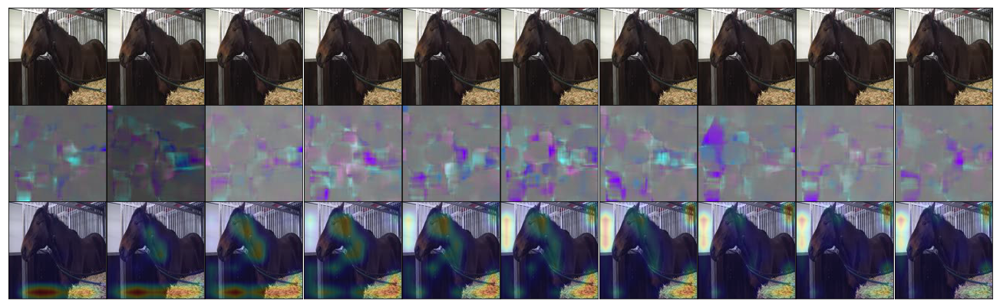

In [18]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  12897
                                                   Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000124.jpg     1
1  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000125.jpg     1
2  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000126.jpg     1
3  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000127.jpg     1
4  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000128.jpg     1
5  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000129.jpg     1
6  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000130.jpg     1
7  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000131.jpg     1
8  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000132.jpg     1
9  data/jpg_128_128_2fps/horse_1/1_5_1/frame_000133.jpg     1
[[[0.5792301  0.46226102]
  [0.55723846 0.5077216 ]
  [0.5260098  0.4391009 ]
  [0.57985365 0.3432291 ]
  [0.65734416 0.28863925]
  [0.70626634 0.2540965 ]
  [0.76610184 0.23445849]
  [0.8355708  0.15714936]
  [0.8622073  0.09868226]
  [0.8980512  0.08061406]]

/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


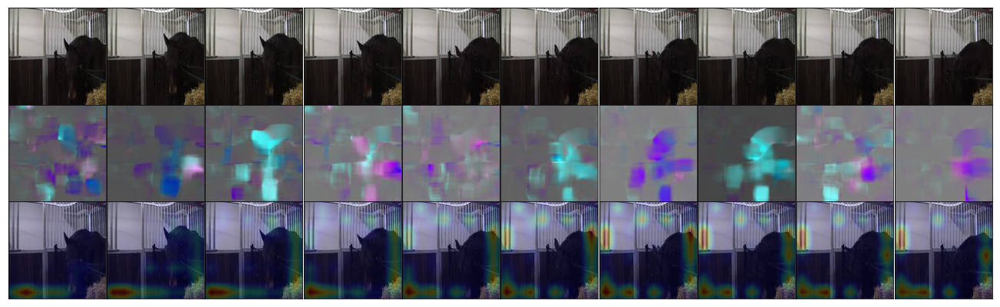

In [19]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);

Chose subject  0
Start index in subject dataframe:  3198
                                                  Path  Pain
0  data/jpg_128_128_2fps/horse_1/1_1b/frame_000527.jpg     0
1  data/jpg_128_128_2fps/horse_1/1_1b/frame_000528.jpg     0
2  data/jpg_128_128_2fps/horse_1/1_1b/frame_000529.jpg     0
3  data/jpg_128_128_2fps/horse_1/1_1b/frame_000530.jpg     0
4  data/jpg_128_128_2fps/horse_1/1_1b/frame_000531.jpg     0
5  data/jpg_128_128_2fps/horse_1/1_1b/frame_000532.jpg     0
6  data/jpg_128_128_2fps/horse_1/1_1b/frame_000533.jpg     0
7  data/jpg_128_128_2fps/horse_1/1_1b/frame_000534.jpg     0
8  data/jpg_128_128_2fps/horse_1/1_1b/frame_000535.jpg     0
9  data/jpg_128_128_2fps/horse_1/1_1b/frame_000536.jpg     0
[[[0.68654287 0.30917278]
  [0.8578246  0.15391894]
  [0.77274424 0.0606248 ]
  [0.67644954 0.02340937]
  [0.694437   0.01727648]
  [0.75854707 0.02016968]
  [0.7988195  0.02432448]
  [0.86498606 0.02731303]
  [0.9021254  0.03520215]
  [0.9406241  0.04311675]]]


/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/sbroome/miniconda2/envs/py365/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


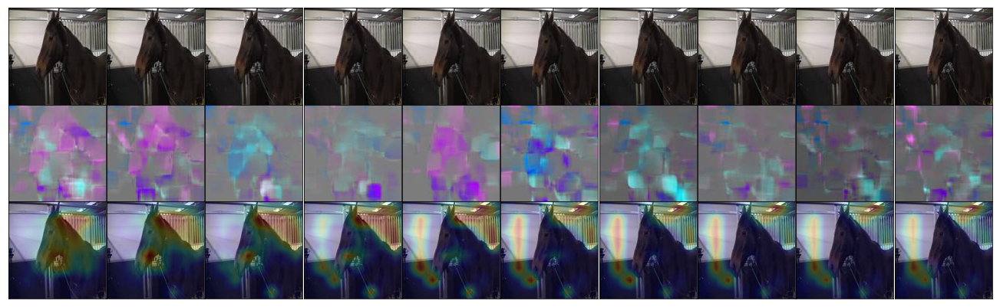

In [20]:
batch_img, batch_flow, batch_label = utils.data_for_one_random_sequence_two_stream(args, subject_dfs, computer='local', subject=0)
run_on_one_sequence(sess, clstm_model, batch_img, batch_flow, two_stream=True);